In [112]:
import cv2
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from pathlib import Path
import dataFrameTools
import processGen
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
# from cloudpickle import CloudPickler
import tensorflow_probability as tfp
import random
from random import randrange
import checkdf
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from sklearn.linear_model import LinearRegression


In [113]:
def loadData2():
    df=dataFrameTools.normalizeDF(0).astype('float32')
    images=[]
    for i in df.index.values:
        filePath=Path("../Processed Images/Grayscale/(" + str(i) + ").png")
        image=cv2.imread(str(filePath),0)
        images.append(image)
    images=np.array(images)
    #scale image values
    images=images/255.0
    split = train_test_split(df, images, test_size=0.3, random_state=42)
    dtrain, dtv, itrain, itv = split
    dtest, dval, itest, ival = train_test_split(dtv, itv, test_size=0.5, random_state=42)
    itrain=tf.expand_dims(itrain, -1)
    ival=tf.expand_dims(ival, -1)
    itest=tf.expand_dims(itest, -1)
    imdims=np.shape(itrain[1])
    ddims=len(dtrain.columns)
    return dtrain,dval,dtest,itrain,ival,itest,imdims,ddims

def custom_sigmoid_cross_entropy_loss_with_logits(x_true, x_recons_logits):
    raw_cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(labels=x_true, logits=x_recons_logits)
    if len(np.shape(x_true))==4:
        neg_log_likelihood = tf.math.reduce_sum(raw_cross_entropy, axis=[1, 2, 3])
    else:
        neg_log_likelihood = tf.math.reduce_sum(raw_cross_entropy, axis=[1])
    return tf.math.reduce_mean(neg_log_likelihood)

In [114]:
class dVAE:
    def __init__(self, datadims, latent_dim, kl_weight, learning_rate):
        self.dim_x = datadims
        self.latent_dim = latent_dim
        self.kl_weight = kl_weight
        self.learning_rate = learning_rate
    def encoder(self, return_mean = 0, trainable=True):
        # define prior distribution for the code, which is an isotropic Gaussian
        prior = tfp.distributions.Independent(tfp.distributions.Normal(loc=tf.zeros(self.latent_dim), scale=1.), 
                                reinterpreted_batch_ndims=1)
        
        model=[layers.InputLayer(input_shape=self.dim_x)]
        
        model.append(layers.Dense(200, name="e0"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))

        model.append(layers.Dense(200, name="e1"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(200, name="e2"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(200, name="e3"))
        model.append(layers.BatchNormalization())
        model.append(layers.LeakyReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(200, name="e4"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(tfp.layers.IndependentNormal.params_size(self.latent_dim), name="e5"))
        if return_mean:
                model.append(tfp.layers.IndependentNormal(self.latent_dim, convert_to_tensor_fn=tfp.distributions.Distribution.mean, activity_regularizer=tfp.layers.KLDivergenceRegularizer(prior, weight=self.kl_weight), name="e6"))
        else:
                model.append(tfp.layers.IndependentNormal(self.latent_dim, convert_to_tensor_fn=tfp.distributions.Distribution.sample, activity_regularizer=tfp.layers.KLDivergenceRegularizer(prior, weight=self.kl_weight), name="e6"))
        return keras.Sequential(model, name='encoder')
    
    
    def decoder(self):
        decoder=keras.Sequential()
        model=[layers.InputLayer(input_shape=(self.latent_dim,))]

        model.append(layers.Dense(200, name="d0"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))

        model.append(layers.Dense(200, name="d1"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(200, name="d2"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(200, name="d3"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        model.append(layers.Dense(200, name="d4"))
        model.append(layers.BatchNormalization())
#         model.append(layers.LeakyReLU())
        model.append(layers.ReLU())
        model.append(layers.Dropout(0.05))
        
        
        model.append(layers.Dense(self.dim_x, name="d5"))

        return keras.Sequential(model, name='decoder')
    
    def build_vae_keras_model(self):
        x_input = keras.Input(shape=self.dim_x)
        encoder = self.encoder()
        decoder = self.decoder()
#         encoder.summary()
#         decoder.summary()
        z = encoder(x_input)
        output=decoder(z)
        negative_log_likelihood = lambda x, rv_x: -rv_x.log_prob(x)
        
        # compile VAE model
        model = keras.Model(inputs=x_input, outputs=output)
        model.compile(loss=custom_sigmoid_cross_entropy_loss_with_logits, optimizer=keras.optimizers.Adam(self.learning_rate))
        return model
    
    def build_vae_keras_model_mean(self):
        x_input = keras.Input(shape=self.dim_x)
        encoder = self.encoder(return_mean=1)
        decoder = self.decoder()
        z = encoder(x_input)
        output=decoder(z)
        negative_log_likelihood = lambda x, rv_x: -rv_x.log_prob(x)
        
        # compile VAE model
        model = keras.Model(inputs=x_input, outputs=output)
        model.compile(loss=custom_sigmoid_cross_entropy_loss_with_logits, optimizer=keras.optimizers.Adam(self.learning_rate))
        return model

In [115]:
def my_loadData2(bikestyle = None):
    df=dataFrameTools.normalizeDF(0).astype('float32')
    if bikestyle:
        red = pd.read_csv("../data/BIKED_reduced.csv", index_col=0)
        if isinstance(bikestyle, list):
            indices = red[red['BIKESTYLE'].isin(bikestyle)].index
        else:
            indices = red[red['BIKESTYLE'] == bikestyle].index
        
        df = df.loc[indices]

    split = train_test_split(df, test_size=0.3, random_state=42)
    dtrain, dtv, = split
    dtest, dval = train_test_split(dtv, test_size=0.5, random_state=42)
    ddims=len(dtrain.columns)
    return dtrain,dval,dtest,ddims

In [116]:
dtrain, dval, dtest, itrain, ival, itest, imdims, ddims = loadData2()
dataVAE_model =dVAE(ddims, 128, 0.1, 1e-3)
dataVAE_mean = dataVAE_model.build_vae_keras_model_mean()
dataVAE_mean.load_weights('../model weights/dataVAE.h5')
encoder_mean =  dataVAE_mean.get_layer('encoder')

Loaded Imputed Dataframe in  1.2931149005889893 seconds


In [126]:
dfn = dataFrameTools.normalizeDF(0).astype('float32')
edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 1045, 3606, 4121, 1052, 4134, 3111, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2652, 2653, 608, 609, 1127, 4718, 624, 4723, 1143, 1148, 3711, 3200, 134, 3210, 1164, 4237, 2193, 149, 2710, 2716, 4255, 681, 4782, 2736, 179, 2231, 1719, 699, 1212, 2750, 3267, 4293, 3270, 2761, 1228, 718, 3804, 4330, 2284, 4336, 4341, 2297, 4350, 3846, 2824, 1292, 1303, 1815, 1308, 3872, 805, 295, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 389, 3974, 2439, 3980, 3982, 917, 3989, 407, 4504, 4505, 3491, 4007, 4008, 1964, 2485, 1461, 2493, 2498, 4548, 4040, 4554, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 4086, 504, 4601, 3066, 4603, 4604]
edited_df = dfn.loc[edited_ids]

used_indices = set()

for index in dval.index.intersection(edited_ids):
    while True:
        random_index = dtest.sample(n=1).index[0]
        if random_index not in used_indices and random_index not in edited_ids:
            used_indices.add(random_index)
            dval.loc[index] = dtest.loc[random_index].values
            break

Loaded Imputed Dataframe in  1.5731837749481201 seconds


In [118]:
def freeze_layers_before(model, target_layer_name):
    found_target = False
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):
            found_target = freeze_layers_before(layer, target_layer_name)
        if layer.name == target_layer_name:
            found_target = True
        if not found_target:
            layer.trainable = False
    return found_target

In [121]:
def unfreeze_all_layers(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):  # Handle nested models
            unfreeze_all_layers(layer)
        layer.trainable = True


In [162]:
tunedVAE = dVAE(ddims, 128, 0.01, 1e-4).build_vae_keras_model()
tunedVAE.load_weights('../model weights/dataVAE.h5')

freeze_layers_before(tunedVAE.get_layer('decoder'), 'd3')
freeze_layers_before(tunedVAE.get_layer('encoder'), 'e3')

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=350)
history = tunedVAE.fit(x=edited_df, y=edited_df, epochs=1000, batch_size=len(edited_df.index), validation_data=(dval, dval), callbacks=[callback])

unfreeze_all_layers(tunedVAE)

tunedVAE.save_weights('../model weights/tunedVAE.h5')
tunedVAE = dVAE(ddims, 128, 0.01, 1e-4).build_vae_keras_model_mean()
tunedVAE.load_weights('../model weights/tunedVAE.h5')
encoder_tuned = tunedVAE.get_layer('encoder')


Epoch 1/1000
1/1 [==============================] - 3s 3s/step - loss: 531.0124 - val_loss: 520.5742
Epoch 2/1000
1/1 [==============================] - 0s 155ms/step - loss: 531.1167 - val_loss: 521.1169
Epoch 3/1000
1/1 [==============================] - 0s 133ms/step - loss: 529.3523 - val_loss: 520.7441
Epoch 4/1000
1/1 [==============================] - 0s 139ms/step - loss: 528.2194 - val_loss: 520.4427
Epoch 5/1000
1/1 [==============================] - 0s 145ms/step - loss: 529.1505 - val_loss: 520.6689
Epoch 6/1000
1/1 [==============================] - 0s 134ms/step - loss: 526.3502 - val_loss: 520.8357
Epoch 7/1000
1/1 [==============================] - 0s 150ms/step - loss: 526.3778 - val_loss: 520.5407
Epoch 8/1000
1/1 [==============================] - 0s 133ms/step - loss: 521.9680 - val_loss: 520.6151
Epoch 9/1000
1/1 [==============================] - 0s 150ms/step - loss: 522.9881 - val_loss: 520.6428
Epoch 10/1000
1/1 [==============================] - 0s 140ms/step 

In [111]:
tunedVAE = dVAE(ddims, 128, 0.1, 1e-3).build_vae_keras_model_mean()
tunedVAE.load_weights('../model weights/tunedVAE.h5')
encoder_tuned = tunedVAE.get_layer('encoder')

ValueError: Cannot assign value to variable ' e0/kernel:0': Shape mismatch.The variable shape (2395, 200), and the assigned value shape (200, 200) are incompatible.

In [5]:
dtrain,dval,dtest,itrain,ival,itest,imdims,ddims=loadData2()
dataVAE=dVAE(ddims, 128, 0.1, 1e-3).build_vae_keras_model()
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=200)
history = dataVAE.fit(x=dtrain, y=dtrain, epochs=5000, batch_size=128, validation_data=(dval, dval), callbacks=[callback])

Loaded Imputed Dataframe in  1.3731744289398193 seconds
Epoch 1/5000
25/25 [==============================] - 5s 57ms/step - loss: 1135.7001 - val_loss: 1488.1952
Epoch 2/5000
25/25 [==============================] - 1s 41ms/step - loss: 705.3582 - val_loss: 1189.7051
Epoch 3/5000
25/25 [==============================] - 1s 37ms/step - loss: 629.7141 - val_loss: 875.4111
Epoch 4/5000
25/25 [==============================] - 1s 38ms/step - loss: 604.9309 - val_loss: 679.7633
Epoch 5/5000
25/25 [==============================] - 1s 37ms/step - loss: 594.0807 - val_loss: 624.9944
Epoch 6/5000
25/25 [==============================] - 1s 34ms/step - loss: 587.0024 - val_loss: 606.9639
Epoch 7/5000
25/25 [==============================] - 1s 33ms/step - loss: 580.7067 - val_loss: 591.0140
Epoch 8/5000
25/25 [==============================] - 1s 32ms/step - loss: 576.8856 - val_loss: 582.7232
Epoch 9/5000
25/25 [==============================] - 1s 34ms/step - loss: 574.1714 - val_loss: 576.4

In [6]:
dataVAE.save_weights('../model weights/dataVAE.h5')

In [5]:
dtrain,dval,dtest,itrain,ival,itest,imdims,ddims=loadData2()
dataVAE=dVAE(ddims, 128, 0.1, 1e-3).build_vae_keras_model()
dataVAE.load_weights('../model weights/dataVAE.h5')

Loaded Imputed Dataframe in  1.2729852199554443 seconds


In [34]:
dtrain, dval, dtest, ddims = my_loadData2(['CITY','COMMUTER','CYCLOCROSS', "ROAD",'TOURING', 'TRACK'])

customVAE = dVAE(ddims, 128, 0.1, 1e-3).build_vae_keras_model()
data_full = np.concatenate([dtrain, dtest], axis=0)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)
history = customVAE.fit(x=data_full, y=data_full, epochs=1000, batch_size=128, validation_data=(dval, dval), callbacks=[callback])

Loaded Imputed Dataframe in  1.351616382598877 seconds
Epoch 1/700
38/38 [==============================] - 5s 32ms/step - loss: 998.2948 - val_loss: 1312.9722
Epoch 2/700
38/38 [==============================] - 1s 21ms/step - loss: 644.8568 - val_loss: 912.1971
Epoch 3/700
38/38 [==============================] - 1s 19ms/step - loss: 602.5255 - val_loss: 683.0626
Epoch 4/700
38/38 [==============================] - 1s 20ms/step - loss: 587.3573 - val_loss: 607.2795
Epoch 5/700
38/38 [==============================] - 1s 19ms/step - loss: 579.4205 - val_loss: 586.2375
Epoch 6/700
38/38 [==============================] - 1s 20ms/step - loss: 574.7308 - val_loss: 575.4504
Epoch 7/700
38/38 [==============================] - 1s 19ms/step - loss: 570.6956 - val_loss: 569.0259
Epoch 8/700
38/38 [==============================] - 1s 19ms/step - loss: 567.5696 - val_loss: 565.9219
Epoch 9/700
38/38 [==============================] - 1s 21ms/step - loss: 564.9674 - val_loss: 563.6641
Epoch 10

In [45]:
dtrain, dval, dtest, ddims = my_loadData2(['CITY','COMMUTER','CYCLOCROSS', "ROAD",'TOURING', 'TRACK'])

customIncVAE = dVAE(ddims, 256, 0.1, 1e-3).build_vae_keras_model()
data_full = np.concatenate([dtrain, dtest], axis=0)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=50)
history = customIncVAE.fit(x=data_full, y=data_full, epochs=2000, batch_size=128, validation_data=(dval, dval), callbacks=[callback])

Loaded Imputed Dataframe in  1.4005863666534424 seconds
Epoch 1/2000
19/19 [==============================] - 5s 58ms/step - loss: 1225.5504 - val_loss: 1539.1135
Epoch 2/2000
19/19 [==============================] - 1s 32ms/step - loss: 766.6277 - val_loss: 1302.5596
Epoch 3/2000
19/19 [==============================] - 1s 32ms/step - loss: 661.4329 - val_loss: 1062.7445
Epoch 4/2000
19/19 [==============================] - 1s 33ms/step - loss: 623.2263 - val_loss: 867.4368
Epoch 5/2000
19/19 [==============================] - 1s 32ms/step - loss: 604.1903 - val_loss: 728.9123
Epoch 6/2000
19/19 [==============================] - 1s 32ms/step - loss: 594.2900 - val_loss: 650.3405
Epoch 7/2000
19/19 [==============================] - 1s 32ms/step - loss: 586.9242 - val_loss: 615.7695
Epoch 8/2000
19/19 [==============================] - 1s 32ms/step - loss: 581.7449 - val_loss: 596.6951
Epoch 9/2000
19/19 [==============================] - 1s 33ms/step - loss: 578.4849 - val_loss: 586.

In [6]:
dtrain, dval, dtest, ddims = my_loadData2(['CITY','COMMUTER','CYCLOCROSS', "ROAD",'TOURING', 'TRACK'])


Loaded Imputed Dataframe in  1.3586630821228027 seconds


In [10]:
customVAE.save_weights('../model weights/custom_train_test_pacience_10.h5')

In [8]:
dtrain, dval, dtest, ddims = my_loadData2(['CITY','COMMUTER','CYCLOCROSS', "ROAD",'TOURING', 'TRACK'])

customVAE = dVAE(ddims, 128, 0.1, 1e-3).build_vae_keras_model()
customVAE.load_weights('../model weights/custom_train_test_pacience_10.h5')

Loaded Imputed Dataframe in  1.5585496425628662 seconds


findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not

findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not

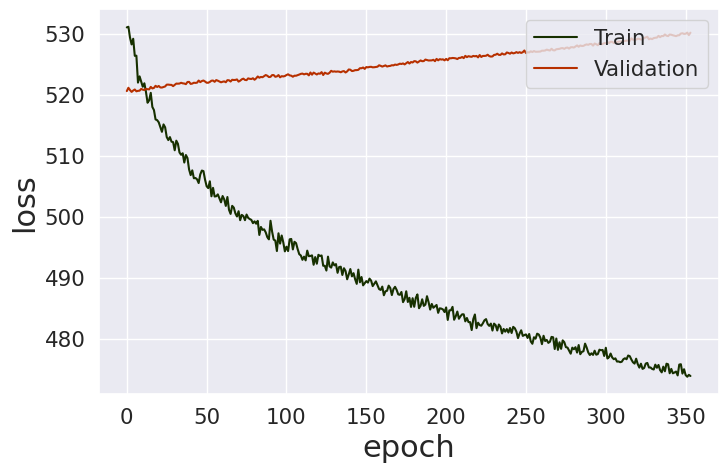

In [164]:
from matplotlib.pyplot import figure
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 14}

plt.rc('font', **font)
plt.rc('axes', labelsize=22)     # fontsize of the axes title
plt.rc('axes', titlesize=22) 
figure(figsize=(8, 5))
plt.plot(history.history['loss'],color='#173000')
plt.plot(history.history['val_loss'], color='#b73000')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

In [12]:
import seaborn as sns

VAE_type = 'custom'

dfn = dataFrameTools.normalizeDF(0).astype('float32')
edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 3606, 1052, 547, 4134, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2135, 2652, 2653, 608, 609, 1121, 1127, 1132, 624, 4723, 1143, 1148, 3711, 3200, 2697, 3210, 1164, 4237, 2193, 149, 2716, 670, 4255, 681, 4782, 179, 2231, 1719, 699, 1212, 2750, 3267, 3268, 4293, 2761, 3787, 1228, 718, 3804, 4318, 4330, 4331, 2284, 4336, 2297, 4350, 2824, 1292, 790, 1303, 1815, 1308, 3868, 2848, 3872, 805, 295, 809, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 3974, 2439, 3464, 3980, 3982, 917, 3989, 407, 3491, 4007, 1964, 2485, 1461, 2493, 4032, 2498, 4548, 4040, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 493, 3055, 4086, 504, 4601, 3066, 4603, 4604]
edited_df = dfn.loc[edited_ids]

encoder = customVAE.get_layer('encoder')
decoder = customVAE.get_layer('decoder')
all_edited_latent = customVAE.layers[1].predict(edited_df)
all_edited_latent_df = pd.DataFrame(all_edited_latent, columns=[f'Feature_{i}' for i in range(all_edited_latent.shape[1])])

# # Create and save combined plots with a rug plot for each column
# for column in all_edited_latent_df.columns:
#     plt.figure(figsize=(10, 6))
#     sns.histplot(all_edited_latent_df[column], bins=10, kde=True)
#     sns.rugplot(all_edited_latent_df[column], height=0.1)
#     plt.title(f'Distribution of {column}')
#     plt.xlabel('Value')
#     plt.ylabel('Frequency/Density')
#     plt.savefig(f'../Latent Distribution/{VAE_type}VAE/{column}_distribution.png')
#     plt.close()

Loaded Imputed Dataframe in  1.4185469150543213 seconds
5/5 [==============================] - 0s 3ms/step


findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not

findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not found.
findfont: Font family 'normal' not

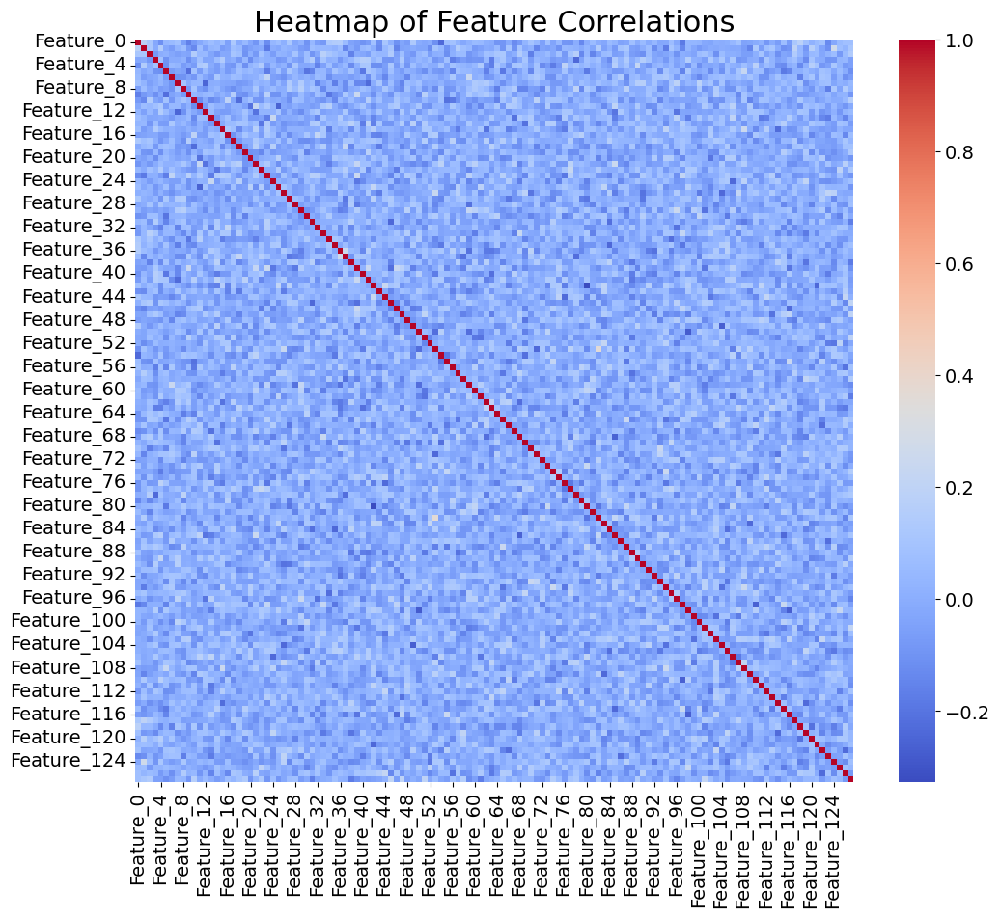

In [13]:
corr = all_edited_latent_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, cmap='coolwarm')
plt.title('Heatmap of Feature Correlations')
plt.show()

In [92]:
dfn = dataFrameTools.normalizeDF(0).astype('float32')
edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 1045, 3606, 4121, 1052, 4134, 3111, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2652, 2653, 608, 609, 1127, 4718, 624, 4723, 1143, 1148, 3711, 3200, 134, 3210, 1164, 4237, 2193, 149, 2710, 2716, 4255, 681, 4782, 2736, 179, 2231, 1719, 699, 1212, 2750, 3267, 4293, 3270, 2761, 1228, 718, 3804, 4330, 2284, 4336, 4341, 2297, 4350, 3846, 2824, 1292, 1303, 1815, 1308, 3872, 805, 295, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 389, 3974, 2439, 3980, 3982, 917, 3989, 407, 4504, 4505, 3491, 4007, 4008, 1964, 2485, 1461, 2493, 2498, 4548, 4040, 4554, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 4086, 504, 4601, 3066, 4603, 4604]

edited_df = dfn.loc[edited_ids]


Loaded Imputed Dataframe in  1.3583989143371582 seconds


In [9]:
from sklearn.feature_selection import mutual_info_regression

edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 3606, 1052, 547, 4134, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2135, 2652, 2653, 608, 609, 1121, 1127, 1132, 624, 4723, 1143, 1148, 3711, 3200, 2697, 3210, 1164, 4237, 2193, 149, 2716, 670, 4255, 681, 4782, 179, 2231, 1719, 699, 1212, 2750, 3267, 3268, 4293, 2761, 3787, 1228, 718, 3804, 4318, 4330, 4331, 2284, 4336, 2297, 4350, 2824, 1292, 790, 1303, 1815, 1308, 3868, 2848, 3872, 805, 295, 809, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 3974, 2439, 3464, 3980, 3982, 917, 3989, 407, 3491, 4007, 1964, 2485, 1461, 2493, 4032, 2498, 4548, 4040, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 493, 3055, 4086, 504, 4601, 3066, 4603, 4604]
edited_df = dfn.loc[edited_ids]
encoder = customVAE.get_layer('encoder')
decoder = customVAE.get_layer('decoder')
all_edited_latent = customVAE.layers[1].predict(edited_df)
all_edited_latent_df = pd.DataFrame(all_edited_latent, columns=[f'Feature_{i}' for i in range(all_edited_latent.shape[1])])

mi_matrix = pd.DataFrame(index=all_edited_latent_df.columns, columns=all_edited_latent_df.columns)

for col_x in all_edited_latent_df.columns:
    for col_y in all_edited_latent_df.columns:
        if col_x != col_y:
            discrete_features = [False]  # Assuming all features are continuous
            mi_matrix.loc[col_x, col_y] = mutual_info_regression(
                all_edited_latent_df[[col_x]], all_edited_latent_df[col_y],
                discrete_features=discrete_features
            )[0]

# Fill diagonal with zeros since mutual information with itself is not relevant
np.fill_diagonal(mi_matrix.values, 0)


Loaded Imputed Dataframe in  1.2909653186798096 seconds
5/5 [==============================] - 1s 5ms/step


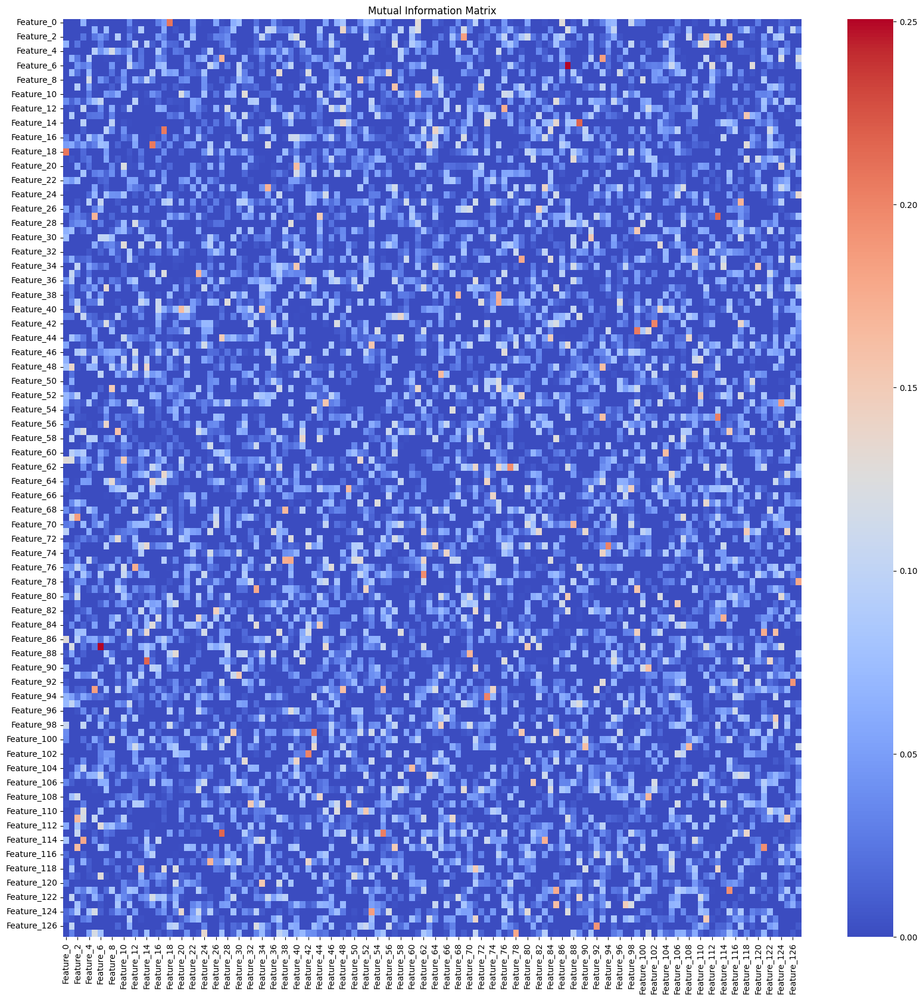

In [12]:
mi_matrix = mi_matrix.astype('float')

plt.figure(figsize=(20, 20))
sns.heatmap(mi_matrix, cmap='coolwarm')
plt.title('Mutual Information Matrix')
plt.show()

Loaded Imputed Dataframe in  1.4709746837615967 seconds
1/1 [==============================] - 0s 146ms/step


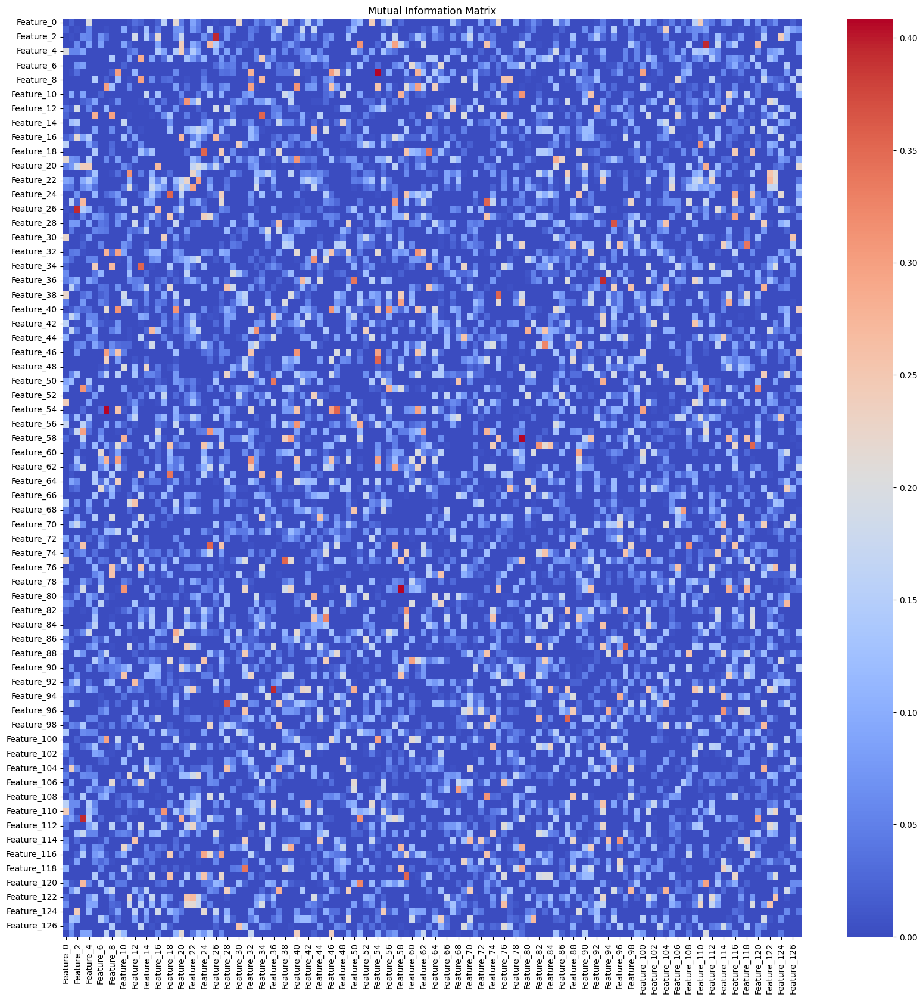

In [13]:
from sklearn.feature_selection import mutual_info_regression

dfn = dataFrameTools.normalizeDF(0).astype('float32')
edited_ids = [583,595,1292,2910,2553,3945]
# edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 3606, 1052, 547, 4134, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2135, 2652, 2653, 608, 609, 1121, 1127, 1132, 624, 4723, 1143, 1148, 3711, 3200, 2697, 3210, 1164, 4237, 2193, 149, 2716, 670, 4255, 681, 4782, 179, 2231, 1719, 699, 1212, 2750, 3267, 3268, 4293, 2761, 3787, 1228, 718, 3804, 4318, 4330, 4331, 2284, 4336, 2297, 4350, 2824, 1292, 790, 1303, 1815, 1308, 3868, 2848, 3872, 805, 295, 809, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 3974, 2439, 3464, 3980, 3982, 917, 3989, 407, 3491, 4007, 1964, 2485, 1461, 2493, 4032, 2498, 4548, 4040, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 493, 3055, 4086, 504, 4601, 3066, 4603, 4604]
edited_df = dfn.loc[edited_ids]
encoder = customVAE.get_layer('encoder')
decoder = customVAE.get_layer('decoder')
all_edited_latent = customVAE.layers[1].predict(edited_df)
all_edited_latent_df = pd.DataFrame(all_edited_latent, columns=[f'Feature_{i}' for i in range(all_edited_latent.shape[1])])

mi_matrix = pd.DataFrame(index=all_edited_latent_df.columns, columns=all_edited_latent_df.columns)

for col_x in all_edited_latent_df.columns:
    for col_y in all_edited_latent_df.columns:
        if col_x != col_y:
            discrete_features = [False]  # Assuming all features are continuous
            mi_matrix.loc[col_x, col_y] = mutual_info_regression(
                all_edited_latent_df[[col_x]], all_edited_latent_df[col_y],
                discrete_features=discrete_features
            )[0]

# Fill diagonal with zeros since mutual information with itself is not relevant
np.fill_diagonal(mi_matrix.values, 0)
mi_matrix = mi_matrix.astype('float')

plt.figure(figsize=(20, 20))
sns.heatmap(mi_matrix, cmap='coolwarm')
plt.title('Mutual Information Matrix')
plt.show()


In [16]:
print(mi_matrix.max().max())

0.40833333333333366


In [58]:

# import seaborn as sns

# VAE_type = 'custom'

# dfn = dataFrameTools.normalizeDF(0).astype('float32')
# # edited_ids = [4330, 4331, 4318, 4416]
# edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 3606, 1052, 547, 4134, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2135, 2652, 2653, 608, 609, 1121, 1127, 1132, 624, 4723, 1143, 1148, 3711, 3200, 2697, 3210, 1164, 4237, 2193, 149, 2716, 670, 4255, 681, 4782, 179, 2231, 1719, 699, 1212, 2750, 3267, 3268, 4293, 2761, 3787, 1228, 718, 3804, 4318, 4330, 4331, 2284, 4336, 2297, 4350, 2824, 1292, 790, 1303, 1815, 1308, 3868, 2848, 3872, 805, 295, 809, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 3974, 2439, 3464, 3980, 3982, 917, 3989, 407, 3491, 4007, 1964, 2485, 1461, 2493, 4032, 2498, 4548, 4040, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 493, 3055, 4086, 504, 4601, 3066, 4603, 4604]
# edited_df = dfn.loc[edited_ids]

# # encoder = dataVAE.get_layer('encoder')
# encoder = encoder_mean
# decoder = dataVAE.get_layer('decoder')
# all_edited_latent = dataVAE.layers[1].predict(edited_df)
# all_edited_latent_df = pd.DataFrame(all_edited_latent, columns=[f'Feature_{i}' for i in range(all_edited_latent.shape[1])])

# # Create and save combined plots with a rug plot for each column
# for column in all_edited_latent_df.columns:
#     plt.figure(figsize=(10, 6))
#     sns.histplot(all_edited_latent_df[column], bins=10, kde=True)
#     sns.rugplot(all_edited_latent_df[column], height=0.1)
#     plt.title(f'Distribution of {column}')
#     plt.xlabel('Value')
#     plt.ylabel('Frequency/Density')
#     plt.savefig(f'../Latent Distribution/dataVAE_full/{column}_distribution.png')
#     plt.close()

Loaded Imputed Dataframe in  1.4195444583892822 seconds
5/5 [==============================] - 0s 3ms/step


In [70]:
dataVAE_model =dVAE(ddims, 128, 0.1, 1e-3)
dataVAE_mean = dataVAE_model.build_vae_keras_model_mean()
dataVAE_mean.load_weights('../model weights/dataVAE.h5')
encoder_mean =  dataVAE_mean.get_layer('encoder')

In [180]:

import seaborn as sns

dfn = dataFrameTools.normalizeDF(0).astype('float32')
selected_ids = [4330, 4331, 4318, 4416]
all_ids = [2051, 2058, 1037, 4114, 21, 2070, 3606, 1052, 547, 4134, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2135, 2652, 2653, 608, 609, 1121, 1127, 1132, 624, 4723, 1143, 1148, 3711, 3200, 2697, 3210, 1164, 4237, 2193, 149, 2716, 670, 4255, 681, 4782, 179, 2231, 1719, 699, 1212, 2750, 3267, 3268, 4293, 2761, 3787, 1228, 718, 3804, 4318, 4330, 4331, 2284, 4336, 2297, 4350, 2824, 1292, 790, 1303, 1815, 1308, 3868, 2848, 3872, 805, 295, 809, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 3974, 2439, 3464, 3980, 3982, 917, 3989, 407, 3491, 4007, 1964, 2485, 1461, 2493, 4032, 2498, 4548, 4040, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 493, 3055, 4086, 504, 4601, 3066, 4603, 4604]
edited_df = dfn.loc[all_ids]
selected_df = dfn.loc[selected_ids]

# encoder = dataVAE.get_layer('encoder')
encoder = encoder_mean

decoder = dataVAE.get_layer('decoder')
all_edited_latent = dataVAE.layers[1].predict(edited_df)
all_edited_latent_df = pd.DataFrame(all_edited_latent, columns=[f'Feature_{i}' for i in range(all_edited_latent.shape[1])])

selected_edited_latent = dataVAE.layers[1].predict(selected_df)
selected_edited_latent_df = pd.DataFrame(selected_edited_latent, columns=[f'Feature_{i}' for i in range(selected_edited_latent.shape[1])])

# Create and save combined plots with a rug plot for each column
for column in all_edited_latent_df.columns:
    plt.figure(figsize=(10, 6))
    
    # Plot the histogram and rug plot
    sns.histplot(all_edited_latent_df[column], bins=10, kde=True)
    sns.rugplot(all_edited_latent_df[column], height=0.1)
    
    # Plot vertical lines for selected latent values
    for value in selected_edited_latent_df[column]:
        plt.axvline(value, color='red', linestyle='--', linewidth=0.8)
    
    # Set titles and labels
    plt.title(f'Distribution of {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency/Density')
    
    plt.savefig(f'../Latent Distribution/dataVAE_showing_selected/{column}_distribution.png')
    plt.close()

Loaded Imputed Dataframe in  1.3998303413391113 seconds
1/1 [==============================] - 0s 18ms/step


In [57]:
small_range_features = [col for col in all_edited_latent_df.columns if all_edited_latent_df[col].max() - all_edited_latent_df[col].min() <= 0.4]

# Display the features that meet the criteria
small_range_features_df = all_edited_latent_df[small_range_features]

# Print the result
print("Features where the difference between the highest and lowest value is <= 0.2:")
print(small_range_features)

Features where the difference between the highest and lowest value is <= 0.2:
['Feature_94']


In [178]:
# #  Regenerate the bikes
# edited_ids = [4416,4318, 4330, 4331]
# edited_df = dfn.loc[edited_ids]
# encoder =  encoder_mean
# decoder = dataVAE.get_layer('decoder')
# latent = encoder.predict(edited_df)  # Correct prediction using encoder
# res = (tf.math.sigmoid(decoder.predict(latent))).numpy()  # Correct use of decoder
# indexnames = [str(i) for i in edited_ids]
# regen_df = pd.DataFrame(data=res, index=indexnames, columns=dfn.columns)  # Correct DataFrame creation
# regen_df.to_csv("../data/Regen.csv")  # Saving to CSV
# processGen.processGen("Regen", denorm=True)


1/1 [==============================] - 0s 17ms/step
Loaded Imputed Dataframe in  1.3282599449157715 seconds
1.0 fraction valid


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat

One-hot encoding 106 features
Onehot Completed in 0.37297821044921875 seconds
Loaded Imputed Dataframe in  1.3387811183929443 seconds


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

,SSSIDECX3,SSSIDECX2,SSSIDECX1,SSSIDECY2,SSSIDECY1,STEMBENDS,FRONTROTORBOLTS,Shoe up angle,Down tube front diameter,LRTHICK,...,Saddle type OHCLASS: fi'zi:k Arione,Saddle type OHCLASS: fi'zi:k Arione TRI,Saddle type OHCLASS: fi'zi:k Tundra,TRACK_ERGO OHCLASS: 1,FRONTPANNIER style OHCLASS: 1,Top tube type OHCLASS: 1,BRAZEonFDTYPE OHCLASS: FD9070F,CSAUX3_MM_RATIO OHCLASS: 1,bottle SEATTUBE0 show OHCLASS: True,bottle DOWNTUBE0 show OHCLASS: False
4416,71.405904,147.224978,339.721694,4.743357,13.565016,0,6,37,36.569133,10,...,0,0,0,0,0,0,0,0,0,0
4318,86.052269,150.658489,327.683643,-6.417954,10.184619,0,6,38,36.002140,10,...,0,0,0,0,0,0,0,0,0,0
4330,86.342732,155.442897,354.896318,5.544769,9.447408,0,6,38,37.254780,10,...,0,0,0,0,0,0,0,0,0,0
4331,86.967885,157.948611,361.208195,5.929375,8.397603,0,6,38,36.855811,10,...,0,0,0,0,0,0,0,0,0,0


In [10]:
edited_ids = [2051, 2058, 1037, 4114, 21, 2070, 3606, 1052, 4134, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2135, 2652, 2653, 608, 609, 1127, 624, 4723, 1143, 1148, 3711, 3200, 3210, 1164, 4237, 2193, 149, 2716, 4255, 681, 4782, 179, 2231, 1719, 699, 1212, 2750, 3267, 4293, 2761, 3787, 1228, 718, 3804, 4318, 4330, 4331, 2284, 4336, 2297, 4350, 2824, 1292, 1303, 1815, 1308, 3868, 2848, 3872, 805, 295, 809, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 3974, 2439, 3464, 3980, 3982, 917, 3989, 407, 3491, 4007, 1964, 2485, 1461, 2493, 4032, 2498, 4548, 4040, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 493, 3055, 4086, 504, 4601, 3066, 4603, 4604]
selected_bikes = [4416,4318, 4330, 4331]
edited_df = dfn.loc[edited_ids]
selected_df = dfn.loc[selected_bikes]
encoder =  encoder_mean
# decoder = dataVAE.get_layer('decoder')
latent_all = encoder.predict(edited_df) 
latent_selected = encoder.predict(selected_df) 
print(latent_selected)


1/1 [==============================] - 0s 36ms/step
[[-7.72808678e-03 -1.12567592e+00 -7.71349221e-02  6.37025014e-02
   2.05110945e-02 -1.29246563e-02  3.20253745e-02 -2.70530358e-02
   8.35764259e-02 -6.65635914e-02 -1.99611336e-02  1.88847147e-02
  -8.75505581e-02  3.97908166e-02 -1.10672139e-01  1.44217350e-02
   1.53134573e+00  2.60909870e-02 -7.51186069e-03  5.29906452e-02
   1.34408809e-02  7.00764954e-02 -2.88580358e-03 -6.93802685e-02
   2.15170197e-02  1.14172077e+00 -3.67551260e-02 -5.78587390e-02
  -6.36817366e-02 -1.61089934e-03 -8.25632177e-03  2.36977898e-02
   7.08764121e-02 -7.86796883e-02 -4.63613495e-03  3.59908901e-02
   2.48594861e-02 -4.05314751e-02 -4.99274544e-02  4.28571999e-02
   1.08819358e-01 -6.10594973e-02 -1.21082962e-02 -3.52141634e-02
   7.01242462e-02 -5.45613468e-02 -8.44163775e-01  9.60402638e-02
   1.55366696e-02  6.48426935e-02  6.85610846e-02 -8.94321576e-02
  -1.30770141e-02  2.87144184e-02 -1.17721409e-03  1.39988586e-03
  -2.50072218e-02 -8.842

In [53]:
edited_ids =  [4318, 2051, 2058, 1037, 4114, 21, 2070, 1045, 3606, 4121, 1052, 4134, 3111, 1580, 2553, 1586, 2100, 2101, 2106, 4669, 3136, 580, 583, 4169, 4171, 4176, 595, 2652, 2653, 608, 609, 1127, 4718, 624, 4723, 1143, 1148, 3711, 3200, 134, 3210, 1164, 4237, 2193, 149, 2710, 2716, 4255, 681, 4782, 2736, 179, 2231, 1719, 699, 1212, 2750, 3267, 4293, 3270, 2761, 1228, 718, 3804, 4330, 2284, 4336, 4341, 2297, 4350, 3846, 2824, 1292, 1303, 1815, 1308, 3872, 805, 295, 2861, 2862, 1838, 1842, 310, 311, 314, 2366, 3902, 4416, 2368, 832, 346, 347, 2909, 2910, 3936, 3941, 4454, 3942, 1385, 3945, 3948, 4464, 4465, 4466, 3958, 4474, 2942, 3972, 389, 3974, 2439, 3980, 3982, 917, 3989, 407, 4504, 4505, 3491, 4007, 4008, 1964, 2485, 1461, 2493, 2498, 4548, 4040, 4554, 3021, 4559, 4055, 3544, 3545, 3035, 3549, 480, 2532, 4581, 3558, 487, 488, 1514, 4588, 4086, 504, 4601, 3066, 4603, 4604]
selected_bikes = [4416, 4318, 4330, 4331]

edited_df = dfn.loc[edited_ids]
selected_df = dfn.loc[selected_bikes]

# encoder = dataVAE.get_layer('encoder')
# decoder = dataVAE.get_layer('decoder')
encoder =  encoder_mean

latent_all = encoder.predict(edited_df)
latent_selected = encoder.predict(selected_df)

latent_all_df = pd.DataFrame(latent_all, index=edited_ids)
latent_selected_df = pd.DataFrame(latent_selected, index=selected_bikes)

# print(latent_all_df)
# print(latent_selected_df)

1/1 [==============================] - 0s 102ms/step


In [193]:
from scipy.spatial.distance import pdist, squareform
latent_array = np.array(latent_all)
dist_matrix = pdist(latent_array, metric='euclidean')
average_distance = np.mean(dist_matrix)
print(f'all avg {average_distance}')

latent_array = np.array(latent_selected)
dist_matrix = pdist(latent_array, metric='euclidean')
print(f'selected {np.mean(dist_matrix)}')

all avg 5.166493824890496
selected 1.8175512178597415


In [195]:
dist_matrix = pdist(latent_selected_df.values, metric='euclidean')

square_dist_matrix = squareform(dist_matrix)
dist_df = pd.DataFrame(square_dist_matrix, index=selected_bikes, columns=selected_bikes)
np.fill_diagonal(dist_df.values, np.inf)
min_distance_pair = np.unravel_index(np.argmin(dist_df.values), dist_df.shape)
min_distance_ids = dist_df.index[min_distance_pair[0]], dist_df.columns[min_distance_pair[1]]
min_distance = dist_df.values[min_distance_pair]
print("Two IDs with the smallest Euclidean distance:", min_distance_ids)
print("Smallest Euclidean distance:", min_distance)

Two IDs with the smallest Euclidean distance: (4330, 4331)
Smallest Euclidean distance: 0.5705343755191387


In [196]:
dist_matrix = pdist(latent_all_df.values, metric='euclidean')

square_dist_matrix = squareform(dist_matrix)
dist_df = pd.DataFrame(square_dist_matrix, index=edited_ids, columns=edited_ids)
np.fill_diagonal(dist_df.values, np.inf)
min_distance_pair = np.unravel_index(np.argmin(dist_df.values), dist_df.shape)
min_distance_ids = dist_df.index[min_distance_pair[0]], dist_df.columns[min_distance_pair[1]]
min_distance = dist_df.values[min_distance_pair]
print("Two IDs with the smallest Euclidean distance:", min_distance_ids)
print("Smallest Euclidean distance:", min_distance)

Two IDs with the smallest Euclidean distance: (4169, 4171)
Smallest Euclidean distance: 0.12151482054555404


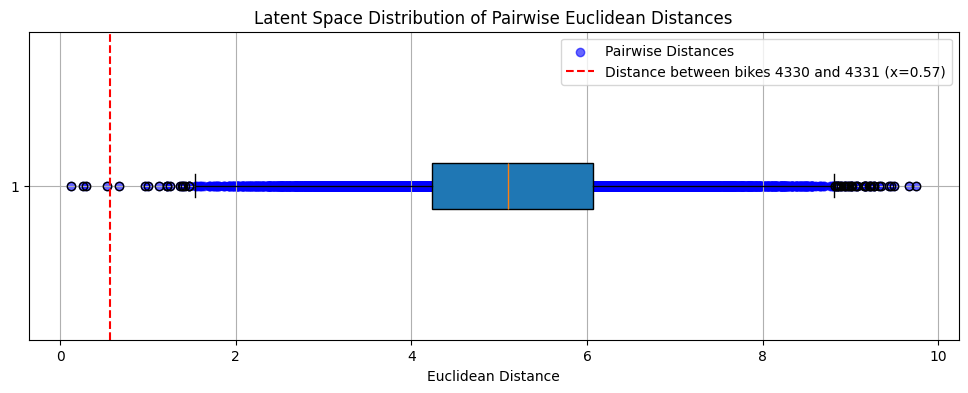

In [198]:
# dist_matrix = pdist(edited_df.values, metric='euclidean')

# Create a sideways (horizontal) box and whisker plot
plt.figure(figsize=(12, 4))
plt.boxplot(dist_matrix, vert=False, patch_artist=True)

# Add all points as a scatter plot below the boxplot
plt.scatter(dist_matrix, np.ones_like(dist_matrix), alpha=0.6, color='blue', label='Pairwise Distances')

# Add a vertical line at x = 146.05
plt.axvline(x=0.57, color='red', linestyle='--', label='Distance between bikes 4330 and 4331 (x=0.57)')

# Add labels and title
plt.xlabel('Euclidean Distance')
plt.title('Latent Space Distribution of Pairwise Euclidean Distances')
plt.legend()
plt.grid(True)

# Display the plot
plt.show()

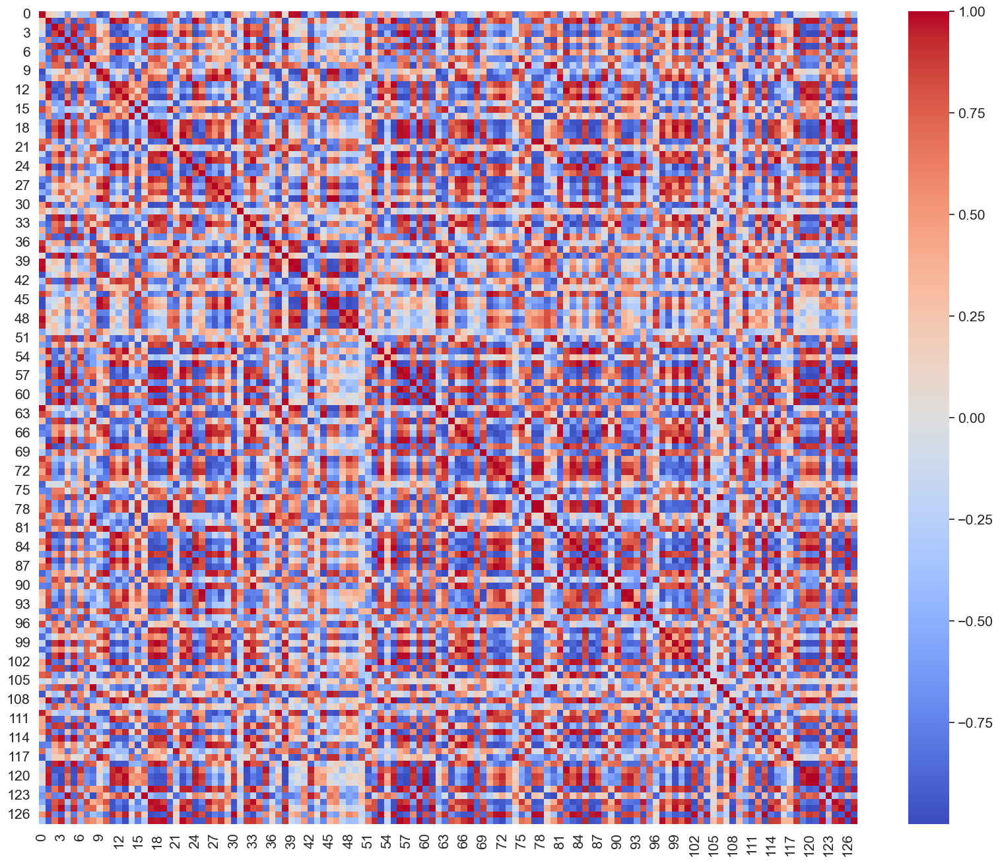

In [201]:

# np.fill_diagonal(mi_matrix.values, 0)
correlation_matrix = latent_selected_df.corr()
sns.set(font_scale=1.4)
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, cmap='coolwarm')
# plt.title('Correlation Matrix')
plt.show()

In [7]:

def get_latent_distribution(latents):
    data = np.stack([np.array(vector) for vector in latents])
    return np.mean(data, axis=0) , np.var(data, axis=0)

In [177]:
selected_bikes = [4416, 4318, 4330, 4331]
selected_df = dfn.loc[selected_bikes]

# encoder =  dataVAE.get_layer('encoder')
encoder = encoder_mean
decoder = dataVAE.get_layer('decoder')
latent = encoder.predict(selected_df) 


latent_mean , latent_var = get_latent_distribution(latent)
mean_arr = latent_mean.tolist()
res=(tf.math.sigmoid(decoder.predict([mean_arr]))).numpy()
print(res)

indices=['mean']
meandf=pd.DataFrame(res, index=indices, columns=dfn.columns)
meandf.to_csv("../data/mean.csv")  # Saving to CSV
processGen.processGen("mean", denorm=True)

1/1 [==============================] - 0s 31ms/step
[[0.16827726 0.23981877 0.26135463 ... 0.01613987 0.01740924 0.9826173 ]]
Loaded Imputed Dataframe in  1.3212172985076904 seconds
1.0 fraction valid


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat

One-hot encoding 106 features
Onehot Completed in 0.3697338104248047 seconds
Loaded Imputed Dataframe in  1.2926177978515625 seconds


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

,SSSIDECX3,SSSIDECX2,SSSIDECX1,SSSIDECY2,SSSIDECY1,STEMBENDS,FRONTROTORBOLTS,Shoe up angle,Down tube front diameter,LRTHICK,...,Saddle type OHCLASS: fi'zi:k Arione TRI,Saddle type OHCLASS: fi'zi:k Gobi,Saddle type OHCLASS: fi'zi:k Tundra,TRACK_ERGO OHCLASS: 1,FRONTPANNIER style OHCLASS: 1,Top tube type OHCLASS: 1,BRAZEonFDTYPE OHCLASS: FD9070F,CSAUX3_MM_RATIO OHCLASS: 1,bottle SEATTUBE0 show OHCLASS: True,bottle DOWNTUBE0 show OHCLASS: False
mean,80.340259,147.93243,337.799756,2.104457,11.52031,0,6,38,36.850658,10,...,0,0,0,0,0,0,0,0,0,0


In [31]:
def pairwise_distance(latent_vectors, mean_vector):
    distances = np.sqrt(np.sum((latent_vectors - mean_vector) ** 2, axis=1))
    return distances



      distance_to_mean
4416         12.459652
4318         11.308223
4330         12.517632
4331         10.199178


In [36]:
latent_vectors = latent_selected_df.values
latent_vectors_edited = latent_all_df.values

distances = pairwise_distance(latent_vectors, latent_mean)
distances_edited = pairwise_distance(latent_vectors_edited, latent_mean)

distancesdf=pd.DataFrame(distances, index=latent_selected_df.index, columns=['distance_to_mean'])
distances_editeddf=pd.DataFrame(distances_edited, index=edited_df.index, columns=['distance_to_mean'])

print(distancesdf)
print(distances_editeddf.min())


      distance_to_mean
4416         10.771305
4318         11.492171
4330         10.360385
4331         11.208505
distance_to_mean    10.539935
dtype: float32


In [40]:
def generate_random_points_within_limits(df, num_points):
    min_values = df.min()
    max_values = df.max()
    
    random_points = np.random.uniform(low=min_values, high=max_values, size=(num_points, df.shape[1]))
    random_points_df = pd.DataFrame(random_points, columns=df.columns)
    
    return random_points_df

# Generate 10 random points
num_points = 20
random_points_df = generate_random_points_within_limits(latent_selected_df, num_points)

print(random_points_df)

         0         1         2         3         4         5         6    \
0   1.350770 -1.694270  0.077140  0.865106 -0.999694  0.076451 -0.288795   
1   1.487657 -1.798843  1.450635  0.417823 -0.283041 -0.582947 -0.028762   
2   2.547243 -1.258697 -1.153102  0.219194 -0.284556 -0.712407  0.706017   
3   1.349756 -1.254635 -0.775126  0.156877 -0.196622 -0.588513  0.172332   
4  -1.327292 -1.889338 -1.431207 -0.117538 -0.006015  0.070191  0.774788   
5   1.540179 -1.418419  0.462911  0.598030 -0.068027 -0.191970 -0.248698   
6  -0.703507 -1.194115  1.154929  0.720225 -0.144975 -0.584950  0.142863   
7  -0.746066 -1.333955 -0.278245 -0.114758 -0.000899 -0.084656  0.389382   
8  -1.419702 -1.769045  0.364248  0.983651 -0.011014 -0.054288  0.126033   
9  -0.413784 -1.414817  1.796485  0.101708 -0.859312  0.108953  0.051763   
10  0.409516 -1.696265 -1.207984  0.078363 -0.447847  0.110685  0.018247   
11  2.091509 -1.533580  0.212341  0.347049 -0.124458 -0.400906  0.260782   
12 -0.491481

In [41]:
# encoder =  dataVAE.get_layer('encoder')
decoder = dataVAE.get_layer('decoder')
# latent = encoder.predict(selected_df) 

# latent_mean , latent_var = get_latent_distribution(latent)
# mean_arr = latent_mean.tolist()
res=(tf.math.sigmoid(decoder.predict(random_points_df))).numpy()
indices=[f'random{i}' for i in range(len(random_points_df.index))]
meandf=pd.DataFrame(res, index=indices, columns=dfn.columns)
meandf.to_csv("../data/random.csv")  # Saving to CSV
processGen.processGen("random", denorm=True)

1/1 [==============================] - 0s 18ms/step
Loaded Imputed Dataframe in  1.4319841861724854 seconds
1.0 fraction valid


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat

One-hot encoding 106 features
Onehot Completed in 0.3938717842102051 seconds
Loaded Imputed Dataframe in  1.4095218181610107 seconds


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

,SSSIDECX3,SSSIDECX2,SSSIDECX1,SSSIDECY2,SSSIDECY1,STEMBENDS,FRONTROTORBOLTS,Shoe up angle,Down tube front diameter,LRTHICK,...,Saddle type OHCLASS: fi'zi:k Arione,Saddle type OHCLASS: fi'zi:k Arione TRI,Saddle type OHCLASS: fi'zi:k Tundra,TRACK_ERGO OHCLASS: 1,FRONTPANNIER style OHCLASS: 1,Top tube type OHCLASS: 1,BRAZEonFDTYPE OHCLASS: FD9070F,CSAUX3_MM_RATIO OHCLASS: 1,bottle SEATTUBE0 show OHCLASS: True,bottle DOWNTUBE0 show OHCLASS: False
random0,81.065467,147.523976,328.693637,-4.138769,12.503842,0,6,38,35.939410,10,...,0,0,0,0,0,0,0,0,0,0
random1,82.821868,158.716721,360.467679,4.302029,13.399013,0,6,38,37.053344,10,...,0,0,0,0,0,0,0,0,0,0
random2,80.630285,158.414438,362.006521,8.582333,20.019226,0,6,37,38.039521,10,...,0,0,0,0,0,0,0,0,0,0
random3,79.828279,147.332373,331.731111,-5.970006,11.420808,0,6,37,36.857544,10,...,0,0,0,0,0,0,0,0,0,0
random4,84.609388,146.535012,331.422640,0.593039,9.736910,0,6,38,36.173254,10,...,0,0,0,0,0,0,0,0,0,0
random5,75.233446,143.826809,317.700859,-3.984444,13.799043,0,6,38,37.198177,10,...,0,0,0,0,0,0,0,0,0,0
random6,80.938602,152.487030,348.485003,4.252735,15.868038,0,6,37,38.150030,10,...,0,0,0,0,0,0,0,0,0,0
random7,79.261206,147.078262,329.071586,-3.199513,12.970902,0,6,38,36.578273,10,...,0,0,0,0,0,0,0,0,0,0
random8,80.191526,148.384578,316.603355,-6.857880,10.708747,0,6,38,35.760670,10,...,0,0,0,0,0,0,0,0,0,0
random9,87.601098,160.959812,372.431753,7.878703,14.616880,0,6,37,37.932003,10,...,0,0,0,0,0,0,0,0,0,0


In [20]:
# edited_df['Saddle height'].idxmax()

4474

C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\915149426.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.5019937689538236' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle height'] = htl
C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\915149426.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.5018438568583002' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle height'] = htl
C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\915149426.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.501693944762777' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle height']

32/32 [==============================] - 0s 5ms/step


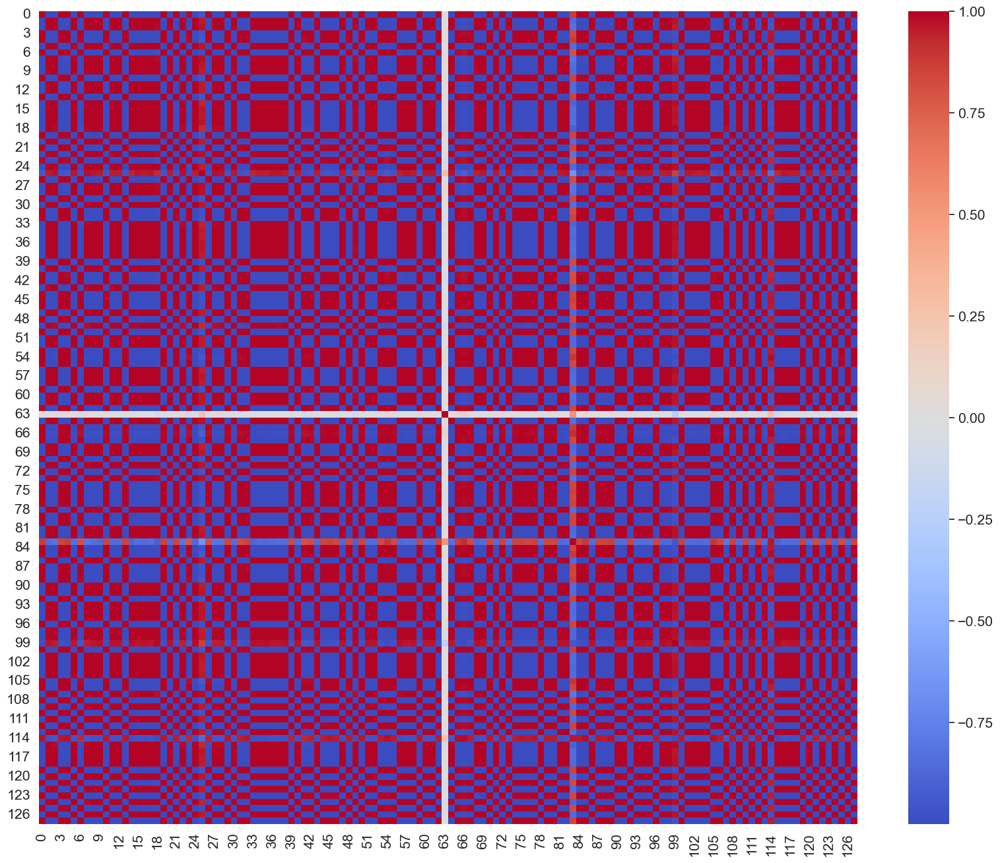

In [146]:
# encoder = encoder_mean
encoder = tunedVAE.get_layer('encoder')
bike_max_htl = edited_df.loc[edited_df['Saddle height'].idxmax()]
# mid_bike = edited_df.loc[1385 ]
# Generate 100 head tube lengths from the maximum to the minimum value within the limits of the dataset
head_tube_lengths = np.linspace(bike_max_htl['Saddle height'], edited_df['Saddle height'].min(), 1000)

# Create new samples
new_samples = []

for htl in head_tube_lengths:
    sample = edited_df.loc[2284 ].copy()
    # sample = bike_max_htl.copy()
    sample['Saddle height'] = htl
    new_samples.append(sample)

# Create a new DataFrame with these samples
new_df = pd.DataFrame(new_samples)

# Encode the new DataFrame to obtain the latent representation
latent_fixed = encoder.predict(new_df)
latent_fixed_df = pd.DataFrame(latent_fixed, index=new_df.index)

# Identify and exclude constant latent variables
non_constant_columns = latent_fixed_df.loc[:, (latent_fixed_df != latent_fixed_df.iloc[0]).any()].columns
latent_fixed_df = latent_fixed_df[non_constant_columns]

# Compute the correlation matrix for the non-constant latent variables
correlation_matrix = latent_fixed_df.corr()

sns.set(font_scale=1.4)
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, cmap='coolwarm', fmt=".2f")
# plt.title('Correlation Matrix')
plt.show()

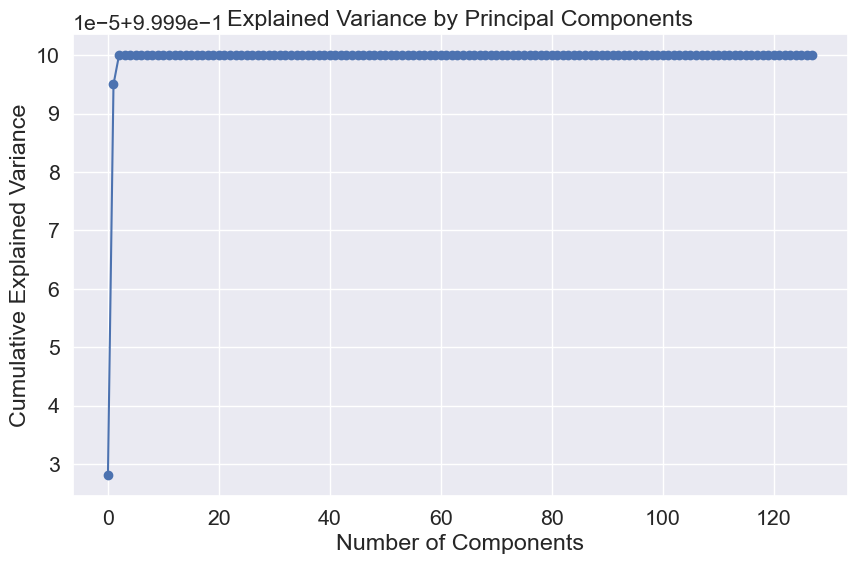

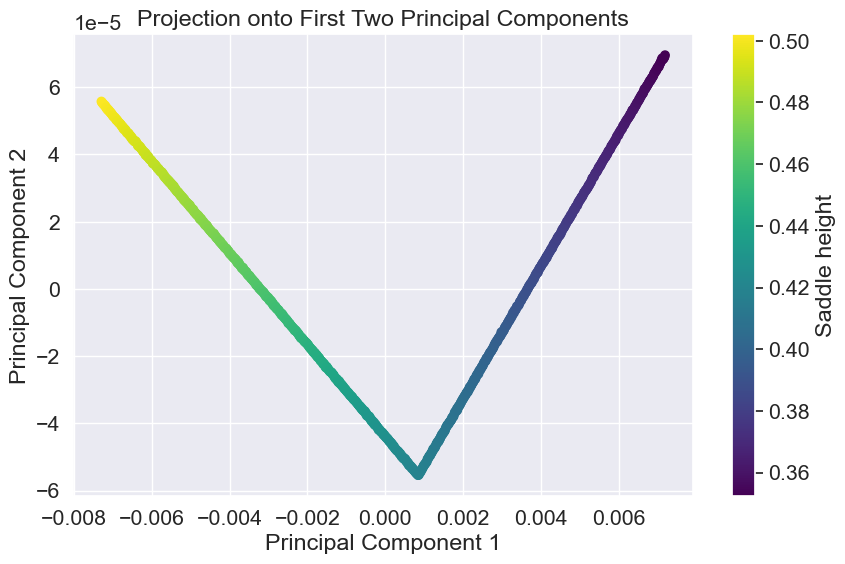

Top 10 features contributing to the first principal component:
Index([113, 91, 16, 79, 1, 78, 86, 106, 12, 82], dtype='int64')


In [147]:
from sklearn.decomposition import PCA

# Assuming latent_fixed_df is already defined

# Perform PCA on the latent representation
pca = PCA()
pca.fit(latent_fixed_df)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the explained variance to determine how many components to consider
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components')
plt.grid(True)
plt.show()

# Choose the number of components that explain a significant amount of variance (e.g., 95%)
n_components = np.argmax(np.cumsum(explained_variance_ratio) >= 0.95) + 1

# Ensure that n_components is at least 2 for visualization purposes
n_components = max(n_components, 2)

# Perform PCA again with the chosen number of components
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(latent_fixed_df)

# Create a DataFrame with the principal components
principal_components_df = pd.DataFrame(principal_components, index=new_df.index)

# Check the shape of the DataFrame to ensure it has at least two components
if principal_components_df.shape[1] >= 2:
    # Visualize the data in the space of the first two principal components
    plt.figure(figsize=(10, 6))
    plt.scatter(principal_components_df.iloc[:, 0], principal_components_df.iloc[:, 1], c=head_tube_lengths, cmap='viridis')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Saddle height')
    plt.title('Projection onto First Two Principal Components')
    plt.grid(True)
    plt.show()
else:
    print("PCA did not produce at least two components.")

# Analyze the principal components to understand the directions of variation
loading_scores = pd.Series(pca.components_[0], index=latent_fixed_df.columns)
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
top_features = sorted_loading_scores.index[:10]

print("Top 10 features contributing to the first principal component:")
print(top_features)

In [148]:
# Get the coefficients for PC1
pc1_coefficients = pca.components_[0]

# Display the equation for PC1 (optional)
features = latent_fixed_df.columns
pc1_equation = "PC1 = " + " + ".join(f"{coef:.4f}*{feature}" for coef, feature in zip(pc1_coefficients, features))
print(pc1_equation)

PC1 = -0.0122*0 + 0.1193*1 + 0.0149*2 + -0.0216*3 + -0.0065*4 + 0.0064*5 + -0.0065*6 + 0.0044*7 + 0.0285*8 + 0.0431*9 + -0.0308*10 + 0.0224*11 + 0.0480*12 + -0.0095*13 + 0.0039*14 + 0.0223*15 + 0.4595*16 + 0.0138*17 + 0.0019*18 + -0.0187*19 + 0.0083*20 + -0.0083*21 + 0.0053*22 + -0.0042*23 + 0.0135*24 + 0.0186*25 + -0.0104*26 + 0.0099*27 + 0.0056*28 + -0.0230*29 + 0.0051*30 + -0.0100*31 + -0.0129*32 + 0.0026*33 + 0.0134*34 + 0.0145*35 + 0.0175*36 + 0.0182*37 + 0.0026*38 + -0.0154*39 + 0.0275*40 + -0.0022*41 + -0.0157*42 + 0.0039*43 + -0.0361*44 + -0.0056*45 + -0.0231*46 + 0.0119*47 + -0.0081*48 + 0.0044*49 + -0.0075*50 + 0.0123*51 + 0.0068*52 + -0.0042*53 + -0.0042*54 + -0.0103*55 + 0.0066*56 + 0.0228*57 + 0.0251*58 + -0.0347*59 + 0.0049*60 + 0.0091*61 + -0.0288*62 + -0.0000*63 + 0.0208*64 + -0.0045*65 + -0.0021*66 + -0.0131*67 + 0.0124*68 + 0.0283*69 + -0.0424*70 + 0.0224*71 + -0.0093*72 + 0.0098*73 + -0.0164*74 + -0.0398*75 + -0.0214*76 + -0.0145*77 + 0.0815*78 + -0.2051*79 + -0.0193

In [136]:
# 2284: [113, 91, 16, 79, 46, 124, 127, 40, 75, 25]

In [154]:
correlation = np.corrcoef(principal_components_df.iloc[:, 0], head_tube_lengths)[0, 1]
if correlation > 0:
    gradient = pc1_coefficients
    print("The gradient of PC1 points towards increasing values of saddle height.")
else:
    gradient = - pc1_coefficients
    print("The gradient of PC1 points towards decreasing values of saddle height.")
    
def move_to_reduce_saddle_height_PCA(latent_point, step_size=0.1):
    return latent_point - step_size * gradient


The gradient of PC1 points towards decreasing values of saddle height.


In [138]:
# bike 1127: [16, 25, 91, 46, 79, 78, 113, 124, 1, 110]
# bike 4255 : [16, 78, 113, 1, 46, 79, 91, 25, 124, 4 ]
#  same for 9 out of 10

In [139]:
# 1127
# 21
# 4782

In [140]:
bike_max_htl = edited_df.loc[edited_df['Saddle length'].idxmax()]
head_tube_lengths = np.linspace(bike_max_htl['Saddle length'], edited_df['Saddle length'].min(), 100000)

new_samples = []
for htl in head_tube_lengths:
    sample = edited_df.loc[1127].copy()
    sample['Saddle length'] = htl
    new_samples.append(sample)

new_samples_df = pd.DataFrame(new_samples)
latent_new = encoder_mean.predict(new_samples_df)


C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\454857766.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.24285642899007567' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle length'] = htl
C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\454857766.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.24285571469726105' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle length'] = htl
C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\454857766.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.2428550004044464' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle length']

C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\454857766.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.23959853946250667' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle length'] = htl
C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\454857766.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.23959782516969205' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle length'] = htl
C:\Users\fabie\AppData\Local\Temp\ipykernel_6412\454857766.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.2395971108768774' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  sample['Saddle length']

KeyboardInterrupt: 

In [ ]:
# bike_v = edited_df.loc[[4474]]

# max_saddle_height = edited_df['Saddle height'].max()
# min_saddle_height = edited_df['Saddle height'].min()

# bike_max_saddle_height = bike_v.copy()
# bike_max_saddle_height['Saddle height'] = max_saddle_height

# bike_min_saddle_height = bike_v.copy()
# bike_min_saddle_height['Saddle height'] = min_saddle_height

# bikes_with_extreme_saddle_heights = pd.concat([bike_max_saddle_height, bike_min_saddle_height])
# latent_extreme = encoder.predict(bikes_with_extreme_saddle_heights)  

In [ ]:
# import numpy as np
# import pandas as pd
# from sklearn.linear_model import LinearRegression

# threshold = 0.41264616002191656

# # Split the data into two subsets based on the threshold
# saddle_heights = new_samples_df['Saddle height'].values
# below_threshold_mask = saddle_heights < threshold
# above_threshold_mask = saddle_heights >= threshold

# latent_below_threshold = latent_new[below_threshold_mask]
# saddle_heights_below_threshold = saddle_heights[below_threshold_mask]

# latent_above_threshold = latent_new[above_threshold_mask]
# saddle_heights_above_threshold = saddle_heights[above_threshold_mask]

# # Fit a regression model for the below threshold data
# reg_model_below = LinearRegression()
# reg_model_below.fit(latent_below_threshold, saddle_heights_below_threshold)

# # Fit a regression model for the above threshold data
# reg_model_above = LinearRegression()
# reg_model_above.fit(latent_above_threshold, saddle_heights_above_threshold)

# # Function to move a point in the latent space to reduce saddle height based on the appropriate model
# def move_to_reduce_saddle_height(latent_point, step_size=0.1):
#     # Compute distances to extreme latent points
#     distance_to_max_extreme = np.linalg.norm(latent_point - latent_extreme[0])
#     distance_to_min_extreme = np.linalg.norm(latent_point - latent_extreme[1])
    
#     # Choose the appropriate model based on the closer extreme latent point
#     if distance_to_min_extreme < distance_to_max_extreme:
#         reg_model = reg_model_below
#     else:
#         reg_model = reg_model_above
    
#     # Compute the gradient (regression coefficients)
#     gradient = reg_model.coef_
    
#     # Move the point in the opposite direction of the gradient
#     new_point = latent_point - step_size * gradient
    
#     return new_point

# # # Example usage
# # example_latent_point = latent_new[0] 
# # new_latent_point = move_to_reduce_saddle_height(example_latent_point)

# # print(f"Original latent point: {example_latent_point}")
# # print(f"New latent point: {new_latent_point}")


In [ ]:
# Assuming latent_new is the latent representation of new_samples_df and we have the saddle heights
saddle_heights = new_samples_df['Saddle length'].values

# Fit a regression model
reg_model = LinearRegression()
reg_model.fit(latent_new, saddle_heights)

def move_to_reduce_saddle_height(latent_point, reg_model, step_size=0.1, target_saddle_height=None):
    # current_saddle_height = reg_model.predict([latent_point])[0]
    # if target_saddle_height is None:
    #     target_saddle_height = current_saddle_height - step_size
    
    gradient = reg_model.coef_
    
    # adjustment_factor = (current_saddle_height - target_saddle_height) / np.linalg.norm(gradient)
    # adjusted_step_size = step_size * adjustment_factor
    
    # Move the point in the opposite direction of the gradient
    # new_point = latent_point + adjusted_step_size * gradient
    new_point = latent_point - step_size * gradient
    
    return new_point

# # Example usage
# given_point = latent_new[0]  # Example point in the latent space
# new_point = move_to_reduce_saddle_height(given_point, reg_model)
# new_point_array = np.array([new_point])

# print(f"Original point: {given_point}")
# print(f"New point (array of arrays): {new_point_array}")

# # Example of reducing saddle height for multiple points
# given_points = latent_new[:5]  # Example points in the latent space

# new_points = []
# for point in given_points:
#     new_point = move_to_reduce_saddle_height(point, reg_model)
#     new_points.append(new_point)

# new_points_array = np.array(new_points)

# print(f"Original points: {given_points}")
# print(f"New points (array of arrays): {new_points_array}")

In [ ]:
edited_df[['Saddle length','Saddle height' ]]

,Saddle length,Saddle height
2051,0.211429,0.440477
2058,0.192857,0.421683
1037,0.211429,0.418159
4114,0.228571,0.442239
21,0.211429,0.418159
...,...,...
504,0.211429,0.421683
4601,0.214286,0.441064
3066,0.240000,0.446350
4603,0.214286,0.440477


In [ ]:
# max_id = edited_df['Saddle height'].idxmax()
# bike_max_htl = edited_df.loc[[487, max_id]]
latent = encoder_mean.predict(edited_df)
pdist(latent, metric='euclidean')


5/5 [==============================] - 0s 2ms/step


array([4.34015625, 3.21032001, 5.20826285, ..., 5.57703748, 5.83135684,
       2.65505367])

In [ ]:
latent = encoder_mean.predict(edited_df)
id_487_index = edited_df.index.get_loc(4474 )
distances = pdist(latent, metric='euclidean')
distance_matrix = squareform(distances)
distances_from_id_487 = distance_matrix[id_487_index]
furthest_index = np.argmax(distances_from_id_487)
furthest_id = edited_df.index[furthest_index]
print(f"The ID that is furthest away from ID 4474 is {furthest_id} with a distance of {distances_from_id_487[furthest_index]}")


5/5 [==============================] - 0s 2ms/step
The ID that is furthest away from ID 4474 is 2284 with a distance of 8.428228151435231


In [ ]:
latent = encoder_mean.predict(edited_df)
distances = pdist(latent, metric='euclidean')
distance_matrix = squareform(distances)
average_distances = np.mean(distance_matrix, axis=1)
sorted_indices = np.argsort(average_distances)
second_middle_index = sorted_indices[2]
second_middle_id = edited_df.index[second_middle_index]

print(f"The bike that is the third most central is {second_middle_id} with an average distance of {average_distances[second_middle_index]}")


5/5 [==============================] - 0s 3ms/step
The bike that is the third most central is 1385 with an average distance of 4.152785708235367


In [ ]:
edited_df['Saddle height'].idxmin()

3210

In [ ]:
mean_saddle_length = edited_df['Saddle length'].mean()
edited_df['Saddle length difference'] = np.abs(edited_df['Saddle length'] - mean_saddle_length)
closest_bike_index = edited_df['Saddle length difference'].idxmin()
closest_bike = edited_df.loc[closest_bike_index]
edited_df.drop(columns=['Saddle length difference'], inplace=True)
print(closest_bike)

SSSIDECX3                               0.099401
SSSIDECX2                               0.242904
SSSIDECX1                               0.269076
SSSIDECY2                               0.173913
SSSIDECY1                               0.295455
                                          ...   
bottle SEATTUBE0 show OHCLASS: False    1.000000
bottle SEATTUBE0 show OHCLASS: True     0.000000
bottle DOWNTUBE0 show OHCLASS: False    0.000000
bottle DOWNTUBE0 show OHCLASS: True     1.000000
Saddle length difference                0.001083
Name: 2100, Length: 2396, dtype: float32


In [ ]:
# 4474
# 2284 
# 487

In [175]:
# max_id = edited_df['Saddle height'].idxmax()
bike = edited_df.loc[[4474]]
# latent = encoder_mean.predict(bike)
encoder_tuned = tunedVAE.get_layer('encoder')
decoder = tunedVAE.get_layer('decoder')

latent = encoder_tuned.predict(bike)
indices = [f'4474saddle_tuned{i}' for i in range(4)]
given_point = latent[0]  # Example point in the latent space

new_points = [given_point]
for i in range(1,4):
    # new_point = move_to_reduce_saddle_height(given_point)

    # new_point = move_to_reduce_saddle_height(given_point, reg_model, i*3)
    new_point = move_to_reduce_saddle_height_PCA(given_point, i*0.6)
    # new_point = move_to_reduce_saddle_height(given_point, reg_model, i*0.5)
    new_points.append(new_point)

# new_point = move_to_reduce_saddle_height(given_point, reg_model, step_size = 1)
new_point_array = np.array(new_points)

res=(tf.math.sigmoid(decoder.predict(new_point_array))).numpy()
meandf=pd.DataFrame(res, index=indices, columns=dfn.columns)
meandf.to_csv("../data/saddle.csv")  # Saving to CSV
saddle_df = processGen.processGen("saddle", denorm=True)
saddle_df['Saddle height']

1/1 [==============================] - 0s 20ms/step
Loaded Imputed Dataframe in  1.6988964080810547 seconds
1.0 fraction valid


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat

One-hot encoding 106 features
Onehot Completed in 0.445465087890625 seconds
Loaded Imputed Dataframe in  1.485039472579956 seconds


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

4474saddle_tuned0    800.529513
4474saddle_tuned1    797.824434
4474saddle_tuned2    776.721459
4474saddle_tuned3    757.479894
Name: Saddle height, dtype: float64

In [ ]:
from sklearn.mixture import GaussianMixture

# Assuming onbike, encoder, and decoder are already defined as given
onbike = dfn.loc[[9,21,52,391]] 
encoder = dataVAE_mean.get_layer('encoder')
decoder = dataVAE.get_layer('decoder')

latent = encoder.predict(onbike)

n_components = 1 
gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=123)
gmm.fit(latent)

n_samples = 10
sampled_latent, _ = gmm.sample(n_samples)
print("Sampled latent points from GMM:")
print(sampled_latent)
res=(tf.math.sigmoid(decoder.predict(sampled_latent))).numpy()
indices=[f'sampled{i}' for i in range(len(sampled_latent))]
meandf=pd.DataFrame(res, index=indices, columns=dfn.columns)
meandf.to_csv("../data/sampled.csv")  # Saving to CSV
processGen.processGen("sampled", denorm=True)



1/1 [==============================] - 0s 26ms/step
Sampled latent points from GMM:
[[ 0.00716477 -0.22801453 -0.01775524 ... -0.01913005  0.0102233
  -0.04567373]
 [-0.01263421  0.43443841 -0.01831821 ... -0.03218289 -0.01674353
  -0.02656149]
 [-0.01452057  0.41830678  0.00164909 ... -0.04001229 -0.01044895
  -0.04193527]
 ...
 [ 0.00641007 -0.30996794 -0.01442255 ... -0.01137481 -0.00365713
  -0.04397493]
 [-0.00921424  0.19362127  0.01098414 ... -0.04104127  0.0104014
  -0.05633313]
 [-0.01057911  0.51051541 -0.01029297 ... -0.04441697  0.00951363
  -0.03548912]]
1/1 [==============================] - 0s 24ms/step
Loaded Imputed Dataframe in  1.5504851341247559 seconds
1.0 fraction valid


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat

One-hot encoding 106 features
Onehot Completed in 0.6407942771911621 seconds
Loaded Imputed Dataframe in  1.221609115600586 seconds


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

,SSSIDECX3,SSSIDECX2,SSSIDECX1,SSSIDECY2,SSSIDECY1,STEMBENDS,FRONTROTORBOLTS,Shoe up angle,Down tube front diameter,LRTHICK,...,Saddle type OHCLASS: fi'zi:k Arione,Saddle type OHCLASS: fi'zi:k Arione TRI,Saddle type OHCLASS: fi'zi:k Gobi,Saddle type OHCLASS: fi'zi:k Tundra,TRACK_ERGO OHCLASS: 1,FRONTPANNIER style OHCLASS: 1,Top tube type OHCLASS: 1,BRAZEonFDTYPE OHCLASS: FD9070F,CSAUX3_MM_RATIO OHCLASS: 1,bottle DOWNTUBE0 show OHCLASS: False
sampled0,81.895221,174.627687,387.827940,2.862891,29.923204,0,6,31,37.498409,10,...,0,0,0,0,0,0,0,0,0,0
sampled1,86.535245,141.976981,332.150595,-7.890727,11.811370,0,6,36,41.021686,10,...,0,0,0,0,0,0,0,0,0,0
sampled2,88.591577,158.358754,353.486120,-6.316998,11.656454,0,6,36,41.418604,10,...,0,0,0,0,0,0,0,0,0,0
sampled3,80.788678,168.956015,350.266754,4.462720,32.056632,0,6,33,38.296188,10,...,0,0,0,0,0,0,0,0,0,0
sampled4,109.642032,137.110488,326.015848,-8.841602,10.450106,0,6,35,41.080013,10,...,0,0,0,0,0,0,0,0,0,0
sampled5,113.016416,139.443692,333.373537,-9.497516,9.927501,0,6,36,41.116283,10,...,0,0,0,0,0,0,0,0,0,0
sampled6,85.473257,141.407062,345.351328,-1.576491,27.602098,0,6,26,31.558860,10,...,0,0,0,0,0,0,0,0,0,0
sampled7,77.675249,167.461310,378.508242,6.197712,42.333096,0,6,30,35.269619,10,...,0,0,0,0,0,0,0,0,0,0
sampled8,78.789234,175.039201,357.141615,1.850882,19.052458,0,6,35,40.650734,10,...,0,0,0,0,0,0,0,0,0,0
sampled9,79.493553,157.406171,349.740341,-5.770923,12.595925,0,6,36,41.507807,10,...,0,0,0,0,0,0,0,0,0,0


In [177]:
#  Regenerate the bikes fine-tuned
regen_ids = [2553, 805,4416,718  ]
# regen_ids = [4474,2284, 487]
regen_df = dfn.loc[regen_ids]
encoder =  dataVAE.get_layer('encoder')
decoder = dataVAE.get_layer('decoder')
latent = encoder.predict(regen_df)  
res = (tf.math.sigmoid(decoder.predict(latent))).numpy()  
indexnames = [str(i) for i in regen_ids]
regen_df = pd.DataFrame(data=res, index=indexnames, columns=dfn.columns)  
regen_df.to_csv("../data/Regen.csv")  
processGen.processGen("Regen", denorm=True)


1/1 [==============================] - 0s 31ms/step
Loaded Imputed Dataframe in  1.5183959007263184 seconds
1.0 fraction valid


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  newdf.at[:,column]=df[column]
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:77: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat

One-hot encoding 106 features
Onehot Completed in 0.3889811038970947 seconds
Loaded Imputed Dataframe in  1.5860209465026855 seconds


c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col]=[0]*len(df.index)
c:\Users\fabie\Desktop\BIKED\Functions\dataFrameTools.py:38: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

,SSSIDECX3,SSSIDECX2,SSSIDECX1,SSSIDECY2,SSSIDECY1,STEMBENDS,FRONTROTORBOLTS,Shoe up angle,Down tube front diameter,LRTHICK,...,Saddle type OHCLASS: fi'zi:k Arione,Saddle type OHCLASS: fi'zi:k Arione TRI,Saddle type OHCLASS: fi'zi:k Gobi,Saddle type OHCLASS: fi'zi:k Tundra,TRACK_ERGO OHCLASS: 1,FRONTPANNIER style OHCLASS: 1,Top tube type OHCLASS: 1,BRAZEonFDTYPE OHCLASS: FD9070F,CSAUX3_MM_RATIO OHCLASS: 1,bottle SEATTUBE0 show OHCLASS: True
2553,78.455291,137.306887,356.097098,-5.942480,24.560114,0,6,39,43.576110,10,...,0,0,0,0,0,0,0,0,0,0
805,65.124737,145.366637,301.762863,-3.789785,30.406685,0,6,35,41.025591,10,...,0,0,0,0,0,0,0,0,0,0
4416,74.004622,151.608324,347.242272,5.575079,18.955579,0,6,37,37.537727,10,...,0,0,0,0,0,0,0,0,0,0
718,64.270954,147.001260,307.280898,-10.519470,6.433144,0,6,36,42.470346,10,...,0,0,0,0,0,0,0,0,0,0


In [179]:

encoder =  dataVAE.get_layer('encoder')
decoder = dataVAE.get_layer('decoder')
latent_data = encoder.predict(edited_df)  
res = (tf.math.sigmoid(decoder.predict(latent_data))).numpy()  
indexnames = [str(i) for i in edited_df.index]
data_regen_df = pd.DataFrame(data=res, index=indexnames, columns=dfn.columns)  

encoder =  tunedVAE.get_layer('encoder')
decoder = tunedVAE.get_layer('decoder')
latent_tuned = encoder.predict(edited_df)  
res = (tf.math.sigmoid(decoder.predict(latent_tuned))).numpy()  
tuned_regen_df = pd.DataFrame(data=res, index=indexnames, columns=dfn.columns)  





5/5 [==============================] - 0s 5ms/step


In [180]:
from scipy.spatial.distance import cdist
distances_data_regen = cdist(edited_df, data_regen_df, metric='euclidean')
distances_tuned_regen = cdist(edited_df, tuned_regen_df, metric='euclidean')

# Calculate average distance for each DataFrame
average_distance_data_regen = np.mean(np.diag(distances_data_regen))
average_distance_tuned_regen = np.mean(np.diag(distances_tuned_regen))

print(f'Average distance to edited_df for data_regen_df: {average_distance_data_regen}')
print(f'Average distance to edited_df for tuned_regen_df: {average_distance_tuned_regen}')

Average distance to edited_df for data_regen_df: 3.9614818615835072
Average distance to edited_df for tuned_regen_df: 2.35197158680853


In [183]:
non_edited_df = dfn.drop(edited_ids)

encoder =  dataVAE.get_layer('encoder')
decoder = dataVAE.get_layer('decoder')
latent_data = encoder.predict(non_edited_df)  
res = (tf.math.sigmoid(decoder.predict(latent_data))).numpy()  
indexnames = [str(i) for i in non_edited_df.index]
data_non_regen_df = pd.DataFrame(data=res, index=indexnames, columns=dfn.columns)  

encoder =  tunedVAE.get_layer('encoder')
decoder = tunedVAE.get_layer('decoder')
latent_tuned = encoder.predict(non_edited_df)  
res = (tf.math.sigmoid(decoder.predict(latent_tuned))).numpy()  
tuned_non_regen_df = pd.DataFrame(data=res, index=indexnames, columns=dfn.columns) 

137/137 [==============================] - 1s 4ms/step


In [184]:
distances_data_regen = cdist(non_edited_df, data_non_regen_df, metric='euclidean')
distances_tuned_regen = cdist(non_edited_df, tuned_non_regen_df, metric='euclidean')

# Calculate average distance for each DataFrame
average_distance_data_regen = np.mean(np.diag(distances_data_regen))
average_distance_tuned_regen = np.mean(np.diag(distances_tuned_regen))

print(f'Average distance to non_edited_df for data_non_regen_df: {average_distance_data_regen}')
print(f'Average distance to non_edited_df for tuned_non_regen_df: {average_distance_tuned_regen}')

Average distance to non_edited_df for data_non_regen_df: 3.5596149172454536
Average distance to non_edited_df for tuned_non_regen_df: 4.039508823667939


In [ ]:
distances_data_regen = cdist(non_edited_df, data_non_regen_df, metric='euclidean')
distances_tuned_regen = cdist(non_edited_df, tuned_non_regen_df, metric='euclidean')

# Calculate average distance for each DataFrame
average_distance_data_regen = np.mean(np.diag(distances_data_regen))
average_distance_tuned_regen = np.mean(np.diag(distances_tuned_regen))

print(f'Average distance to non_edited_df for data_non_regen_df: {average_distance_data_regen}')
print(f'Average distance to non_edited_df for tuned_non_regen_df: {average_distance_tuned_regen}')

Average distance to non_edited_df for data_non_regen_df: 3.5596149172454536
Average distance to non_edited_df for tuned_non_regen_df: 4.039508823667939
